### Imports

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import SimpleITK as sitk

from myscripts import array_dict, get_metrics_df, find_combined_img

from mpl_toolkits.axes_grid1 import ImageGrid
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay, f1_score, precision_score, accuracy_score, recall_score, roc_curve, auc
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, AveragePooling2D
from tensorflow.keras.models import Sequential, load_model
from tensorflow.math import confusion_matrix
from tensorflow.random import set_seed


np.random.seed(24)

### T2 CNN Model

#### Setting up model

In [3]:
# setting control arrays
control_arrays_dict = array_dict('control', 't2', 'all', 'dcm')

9480 pictures converted.


In [4]:
# setting schiz arrays
schiz_arrays_dict = array_dict('schiz', 't2', 'all', 'dcm')

8040 pictures converted.


In [4]:
# setting up X and y
# combining control and schizophrenic scans
X = [each['scan'] for each in control_arrays_dict] + [each['scan'] for each in schiz_arrays_dict]

# convert to array and checking for shape of arrays
X_arr = np.array(X, dtype=object)
print(f'X shape: {X_arr.shape}')

# setting control scans to 0 and schizophrenic scans to 1
y = [0] * len(control_arrays_dict) + [1] * len(schiz_arrays_dict)

# convert to array and check shape
y = np.array(y)
print(f'y shape: {y.shape}')

X shape: (17520, 1, 192, 192)
y shape: (17520,)


In [5]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=24, stratify=y)

In [6]:
# reshape to prep for cnn
X_train = np.array(X_train).reshape(len(X_train), 192, 192, 1)

In [7]:
# reshape to prep for cnn
X_test = np.array(X_test).reshape(len(X_test), 192, 192, 1)

In [8]:
# load first model
model = load_model('../models/model_first_t2.h5')

#### Model Analysis 

In [10]:
model.evaluate(X_test, y_test, batch_size=32, workers=-1)

137/137 [==============================] - 54s 395ms/step - loss: 0.2465 - accuracy: 0.8947


[0.24648414552211761, 0.894748866558075]

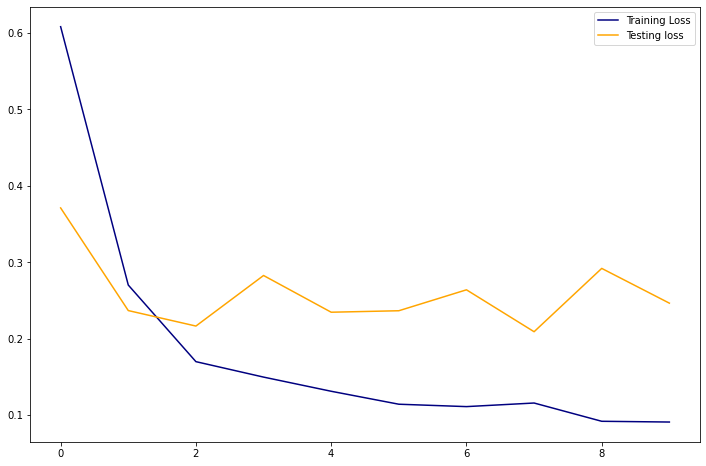

In [20]:
train_loss = history.history['loss']
test_loss = history.history['val_loss']

plt.figure(figsize=(12,8))
plt.plot(train_loss, label='Training Loss', color='navy')
plt.plot(test_loss, label='Testing loss', color='orange')
plt.legend();

In [11]:
# setting up predictions
y_preds = model.predict(X_test)
y_preds = np.round(y_preds, decimals=0)
y_preds = y_preds.astype(int);

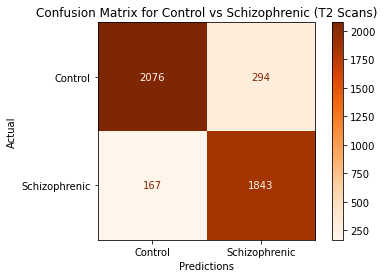

In [167]:
# creating confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_preds, cmap='Oranges')

plt.title('Confusion Matrix for Control vs Schizophrenic (T2 Scans)')
plt.xlabel('Predictions')
plt.ylabel('Actual')

plt.xticks(ticks=[0,1], labels=['Control', 'Schizophrenic'])
plt.yticks(ticks=[0,1], labels=['Control', 'Schizophrenic']);

In [410]:
metrics_df = get_metrics_df(y_preds, y_test)
metrics_df

,scores
accuracy,0.8947
recall,0.9169
precision,0.8624
specificity,0.8759
f1 score,0.8888
misclassification,0.1053


In [502]:
# misclassified list
misclass_list = []
for i in range(0, len(y_test)):
    if y_test[i] != y_preds.flatten()[i]:
        misclass_list.append(i)

# misclassified array list
misclass_array_list = []
for i in misclass_list:
    misclass_array_list.append(X_test[i])

In [503]:
# control scans misclassified as schiz
control_misclass = []
for each in misclass_array_list:
    for item in control_arrays_dict:
        if np.array_equal(each, item['scan'].reshape(192, 192, 1)) == True:
            control_misclass.append(item['path'])
            
# schiz scans misclassified as control
schiz_misclass = []
for each in misclass_array_list:
    for item in schiz_arrays_dict:
        if np.array_equal(each, item['scan'].reshape(192, 192, 1)) == True:
            schiz_misclass.append(item['path'])

In [504]:
# misclassified slice dataframes
slice_c_df = pd.DataFrame()
slice_c_df['slice'] = [int(each[100:103]) for each in control_misclass]
# slice_c_df['schiz'] = 0


slice_s_df = pd.DataFrame()
slice_s_df['slice'] = [int(each[96:99]) for each in schiz_misclass]
# slice_s_df['schiz'] = 1

# misclass_slice_df = pd.concat([slice_s_df, slice_c_df], axis=0)

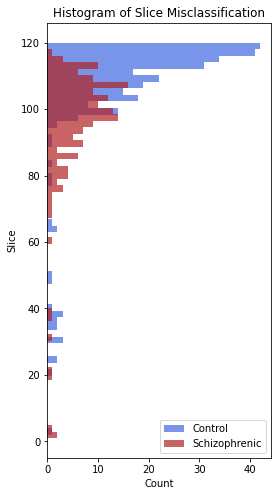

In [518]:
# histogram for slice misclassification
plt.figure(figsize=(4, 8))
plt.hist(slice_c_df, bins=60, alpha=.7, color='royalblue', label='Control', orientation='horizontal')
plt.hist(slice_s_df, bins=60, alpha=.7, color='firebrick', label='Schizophrenic', orientation='horizontal')

plt.title('Histogram of Slice Misclassification')
plt.xlabel('Count')
plt.ylabel('Slice')
plt.legend();

In [326]:
# misclassified patient dataframes
patient_c_misclass = [each[46:55] for each in control_misclass]
patient_c_df = pd.DataFrame([{'patient': each, 'slices': patient_c_misclass.count(each)} for each in set(patient_c_misclass)])
# patient_c_df['percentage'] = patient_c_df['slices']/192

patient_s_misclass = [each[42:51] for each in schiz_misclass]
patient_s_df = pd.DataFrame([{'patient': each, 'slices': patient_s_misclass.count(each)} for each in set(patient_s_misclass)])
patient_s_df['percentage'] = patient_s_df['slices']/120

In [338]:
print(f'mean = {patient_c_df["slices"].mean()}')
patient_c_df.sort_values(by='slices', ascending=False).head()

mean = 4.323529411764706


,patient,slices,percentage
47,A00014898,12,0.062500
27,A00019888,9,0.046875
46,A00011725,9,0.046875
38,A00022729,8,0.041667
56,A00023131,8,0.041667


In [413]:
print(f'mean = {patient_s_df["slices"].mean()}')
patient_s_df.sort_values(by='slices', ascending=False).head()

mean = 3.2745098039215685


,patient,slices,percentage
47,A00023246,11,0.057292
37,A00027119,10,0.052083
18,A00024959,9,0.046875
8,A00014636,8,0.041667
48,A00012767,7,0.036458


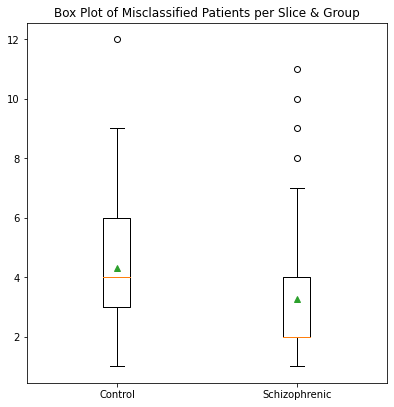

In [437]:
# Boxplot of misclassifed patients per slice & group

data = [patient_c_df['slices'], patient_s_df['slices']]

fig = plt.figure(figsize =(5, 5))


# Creating axes instance
ax = fig.add_axes([0, 0, 1, 1])
 
# Creating plot
bp = ax.boxplot(data, showmeans=True)
 
# show plot
plt.title('Box Plot of Misclassified Patients per Slice & Group')
plt.xticks(ticks=[1,2], labels=['Control', 'Schizophrenic'])
plt.show()

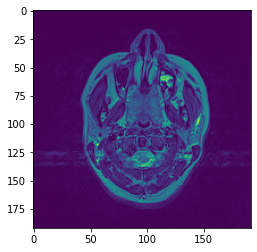

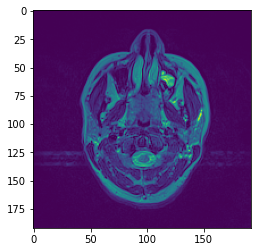

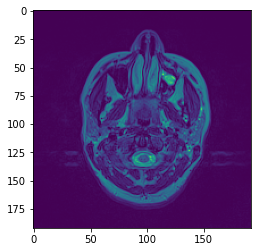

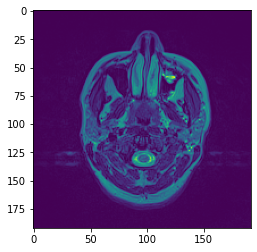

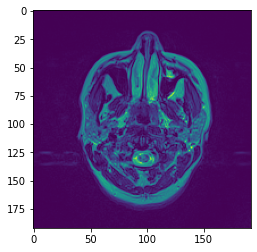

...

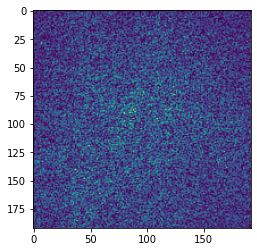

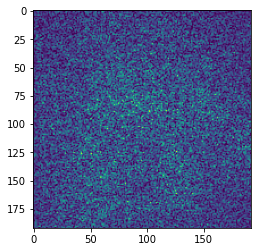

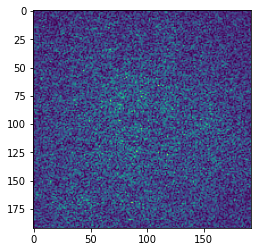

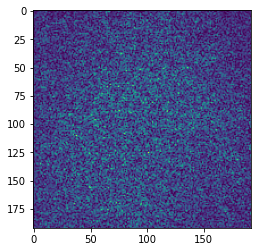

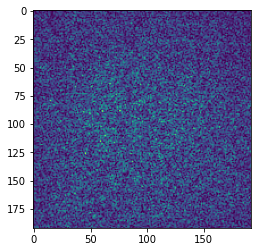

In [58]:
test_path = '../brain_images/no_known_disorder/cobre_07325/A00028052/Session_1/t2_tse_tra_192_0004/'
for each in os.listdir(test_path):
    test_image = sitk.ReadImage(test_path+each) 
    test_img_arr = sitk.GetArrayFromImage(test_image[:,:,0])
    plt.imshow(test_img_arr)
    plt.show()

In [464]:
# control misclassification array list
control_misclass_array = []
for each in misclass_array_list:
    for item in control_arrays_dict:
        if np.array_equal(each, item['scan'].reshape(192, 192, 1)) == True:
            control_misclass_array.append(each)
            
# schiz misclassified array list
schiz_misclass_array = []
for each in misclass_array_list:
    for item in schiz_arrays_dict:
        if np.array_equal(each, item['scan'].reshape(192, 192, 1)) == True:
            schiz_misclass_array.append(each)

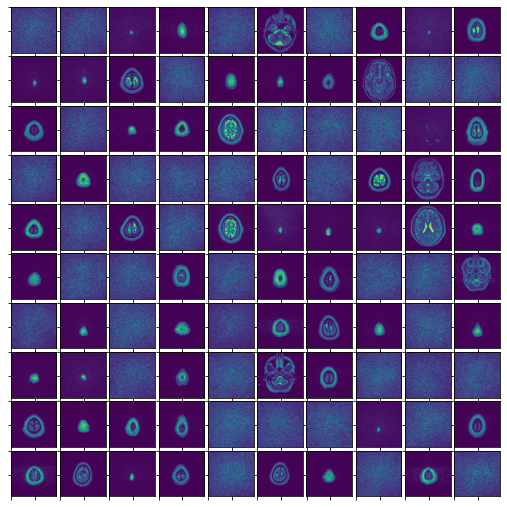

In [511]:
fig = plt.figure(figsize=(9,9))
grid = ImageGrid(fig, 111, 
                 nrows_ncols=(10, 10),  # grid size
                 axes_pad=0.05,  # pad between axes
                 share_all=True
                 )

for ax, im in zip(grid, control_misclass_array):
        ax.set_yticklabels([])
        ax.set_xticklabels([])
        ax.imshow(im)

plt.show()

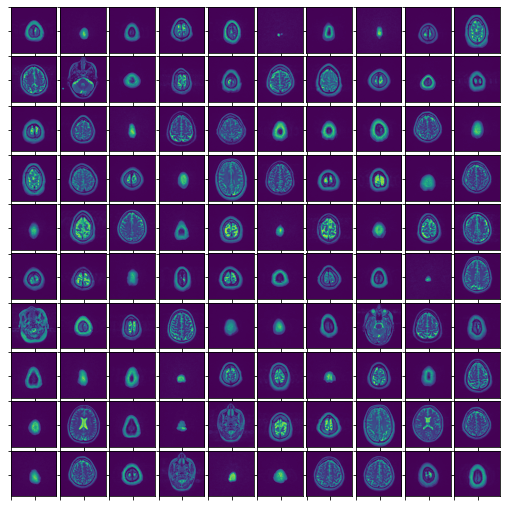

In [512]:
fig = plt.figure(figsize=(9,9))
grid = ImageGrid(fig, 111, 
                 nrows_ncols=(10, 10),  # creates 2x2 grid of axes
                 axes_pad=0.05,  # pad between axes
                 share_all=True
                 )

for ax, im in zip(grid, schiz_misclass_array):
        ax.set_yticklabels([])
        ax.set_xticklabels([])
        ax.imshow(im)

plt.show()

In [9]:
from skimage.exposure import adjust_gamma

In [5]:
# all control images & reshape
control_scans = [each['scan'] for each in control_arrays_dict]
control_scans = np.array(control_scans).reshape(9480, 192, 192, 1)

# all schiz images & reshape
schiz_scans = [each['scan'] for each in schiz_arrays_dict]
schiz_scans = np.array(schiz_scans).reshape(8040, 192, 192, 1)

In [6]:
def find_combined_img(matrix, title, calculation, size = (192, 192), cmap='Greys_r'):
    # calculate the average
    if calculation == 'mean':
        comb_img = np.mean(matrix, axis = 0)
    if calculation == 'var':
        comb_img = np.var(matrix, axis = 0)
    if calculation == 'std':
        comb_img = np.std(matrix, axis = 0)
    # reshape it back to a matrix
    comb_img = comb_img.reshape(size)
    plt.imshow(comb_img, vmin=0, vmax=255, cmap=cmap)
    plt.title(f'Combined {title} by {calculation}')
    plt.axis('off')
    plt.show()
    return comb_img

# https://towardsdatascience.com/exploratory-data-analysis-ideas-for-image-classification-d3fc6bbfb2d2

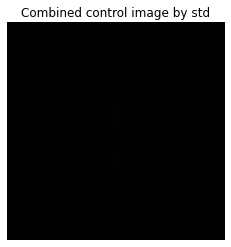

In [18]:
# set combined image
control_mean_img = find_combined_img(control_scans, 'control image', 'std');

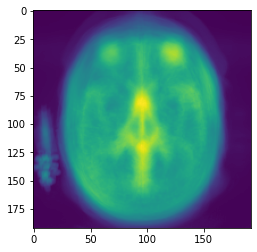

In [19]:
# adjust brightness to bring out combined image
plt.imshow(adjust_gamma(control_mean_img, gamma=1, gain=1));

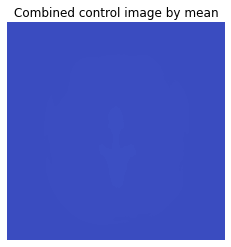

In [20]:
# set combined image
schiz_mean_img = find_combined_img(schiz_scans, 'control image', 'mean', cmap='coolwarm');

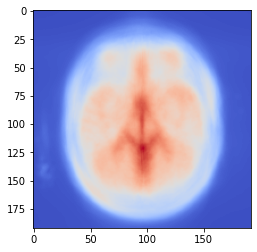

In [21]:
# adjust brightness to bring out combined image
plt.imshow(adjust_gamma(schiz_mean_img, gamma=1, gain=1), cmap='coolwarm');

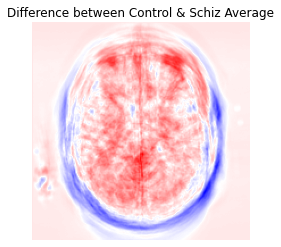

In [110]:
contrast_mean = control_mean_img -schiz_mean_img
plt.imshow(contrast_mean, cmap='bwr')
plt.title('Difference between Control & Schiz Average')
plt.axis('off')
plt.show()

----

### Field Application

**Note**: In the field a doctor will likely have accsess to all the scans for a particular patient, thus running a model on the entirety of the scans has most practical utility

In [12]:
# finding control patients in X_test
control_eval = []
for each in X_test:
    for item in control_arrays_dict:
        if np.array_equal(each, item['scan'].reshape(192, 192, 1)) == True:
            control_eval.append(item['path'])

In [13]:
# finding schiz patients in X_test
schiz_eval = []
for each in X_test:
    for item in schiz_arrays_dict:
        if np.array_equal(each, item['scan'].reshape(192, 192, 1)) == True:
            schiz_eval.append(item['path'])

In [93]:
# Creating patient dataframe
control_eval_df = pd.DataFrame()
control_eval_df['patient'] = [each[46:55] for each in control_eval]

# Creating patient dataframe
schiz_eval_df = pd.DataFrame()
schiz_eval_df['patient'] = [each[42:51] for each in schiz_eval]

# concating dataframes 
eval_df = pd.concat([control_eval_df, schiz_eval_df], axis=0)

In [98]:
eval_df.value_counts().head(30)

patient  
A00014636    68
A00014898    68
A00014830    67
A00022729    65
A00023590    65
A00024820    65
A00014804    62
A00024372    59
A00024663    58
A00026945    56
A00024932    56
A00024959    55
A00023243    52
A00022810    40
A00020984    40
A00016720    38
A00027119    38
A00022592    37
A00018434    37
A00000300    37
A00006754    37
A00014607    36
A00022653    36
A00022490    36
A00024301    36
A00000541    36
A00020787    35
A00024955    35
A00014120    35
A00023246    35
dtype: int64

##### Most slices misclassified for both classes are: 
* A00014898 (12 misclassified) - has 68 slices in X_test
* A00023246 (11 misclassified) - has 35 slices in X_test

In [100]:
eval_path_1 = '../brain_images/no_known_disorder/cobre_07325/A00014898/Session_2/t2_tse_tra_192_0010/'
eval_path_2 = '../brain_images/schizophrenic/cobre_07325/A00023246/Session_1/t2_tse_tra_192_0002/'

In [111]:
patient_1_scans = []
for each in os.listdir(eval_path_1):
    if 'dcm' in each:
        img = sitk.ReadImage(eval_path_1+each)
        img_arr = sitk.GetArrayFromImage(img)
        img_arr = img_arr.reshape(192, 192, 1)
        patient_1_scans.append(img_arr)

patient_1_preds = model.predict(np.array(patient_1_scans))

patient_1_preds_df = pd.DataFrame(patient_1_preds)

In [117]:
patient_1_preds_df

,0
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
115,1.0
116,1.0
117,1.0
118,1.0


In [106]:
patient_1_preds.mean()

0.12499978

In [132]:
patient_1_preds_df.value_counts(normalize=True)

0.000000    0.866667
1.000000    0.108333
0.000003    0.008333
0.999973    0.008333
0.999997    0.008333
dtype: float64

In [122]:
patient_2_scans = []
for each in os.listdir(eval_path_2):
    if 'dcm' in each:
        img = sitk.ReadImage(eval_path_2+each)
        img_arr = sitk.GetArrayFromImage(img)
        img_arr = img_arr.reshape(192, 192, 1)
        patient_2_scans.append(img_arr)

patient_2_preds = model.predict(np.array(patient_2_scans))

patient_2_preds_df = pd.DataFrame(patient_2_preds)

In [131]:
patient_2_preds_df.tail(15)

,0
105,1.0
106,0.0
107,1.0
108,1.0
109,1.0
110,1.0
111,1.0
112,1.0
113,1.0
114,1.0


In [124]:
patient_2_preds_df.mean()

0    0.916667
dtype: float32

In [133]:
patient_2_preds_df.value_counts(normalize=True)

1.0    0.916667
0.0    0.083333
dtype: float64

In [151]:
patient_1_preds.flatten()

array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e+00,
       0.0000000e+00, 0.0000000e+00, 0.0000000e+00, 0.0000000e

In [9]:
y_preds = model.predict(X_test)

In [10]:
y_preds

array([[1.0000000e+00],
       [5.0182790e-01],
       [9.1981912e-01],
       ...,
       [4.0287452e-16],
       [3.7226583e-11],
       [7.6437543e-13]], dtype=float32)

### Unused Analysis (Potential Future Use)

#### Roc Auc

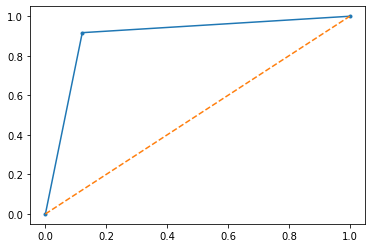

In [106]:
# roc auc curve -- only using 1 point--LOOK for something better

nn_fpr_keras, nn_tpr_keras, nn_thresholds_keras = roc_curve(y_test, y_preds)
auc_keras = auc(nn_fpr_keras, nn_tpr_keras)
plt.plot(nn_fpr_keras, nn_tpr_keras, marker='.', label='Neural Network (auc = %0.3f)' % auc_keras)

plt.plot([0,1], [0,1], label='baseline', linestyle='--');

# https://www.codegrepper.com/code-examples/python/plot+roc+curve+for+neural+network+keras

#### Attempt at Gradient Ascent

In [ ]:
# https://keras.io/examples/vision/visualizing_what_convnets_learn/

In [14]:
from tensorflow import keras

In [15]:
model = load_model('../models/model_first_t2.h5')

In [16]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 190, 190, 64)      640       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 95, 95, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 93, 93, 128)       73856     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 46, 46, 128)      0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 270848)            0         
                                                                 
 dense (Dense)               (None, 64)                1

In [17]:
# dimensions
img_width = 192
img_height = 192

layer_name = 'conv3_block4_out'

In [19]:
model = keras.applications.ResNet50V2(weights='imagenet', include_top=False)

layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.inputs, outputs=layer.output)

In [20]:
def compute_loss(input_image, filter_index):
    activatoin = feature_extractor(input_image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

In [22]:
def gradient_ascent_step(img, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img, filter_index)
    # Compute gradients.
    grads = tape.gradient(loss, img)
    # Normalize gradients.
    grads = tf.math.l2_normalize(grads)
    img += learning_rate * grads
    return loss, img

In [23]:
def initialize_image():
    # We start from a gray image with some random noise
    img = tf.random.uniform((1, img_width, img_height, 3))
    # ResNet50V2 expects inputs in the range [-1, +1].
    # Here we scale our random inputs to [-0.125, +0.125]
    return (img - 0.5) * 0.25


def visualize_filter(filter_index):
    # We run gradient ascent for 20 steps
    iterations = 30
    learning_rate = 10.0
    img = initialize_image()
    for iteration in range(iterations):
        loss, img = gradient_ascent_step(img, filter_index, learning_rate)

    # Decode the resulting input image
    img = deprocess_image(img[0].numpy())
    return loss, img


def deprocess_image(img):
    # Normalize array: center on 0., ensure variance is 0.15
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.15

    # Center crop
    img = img[25:-25, 25:-25, :]

    # Clip to [0, 1]
    img += 0.5
    img = np.clip(img, 0, 1)

    # Convert to RGB array
    img *= 255
    img = np.clip(img, 0, 255).astype("uint8")
    return img

In [24]:
from IPython.display import Image, display

loss, img = visualize_filter(0)
keras.preprocessing.image.save_img("0.png", img)

NameError: name 'tf' is not defined

In [ ]:
display(Image("0.png"))

#### Attempt at EigenImages

In [28]:
from sklearn.decomposition import PCA
from math import ceil


# PCA only takes in 2D 
def eigenimages(matrix, title, n_comp = 0.7, size = (192, 192)):
    # fit PCA to describe n_comp * variability in the class
    pca = PCA(n_components = n_comp, whiten = True)
    pca.fit(matrix)
    print('Number of PC: ', pca.n_components_)
    return pca
      
def plot_pca(pca, size = (192, 192)):
    # plot eigenimages in a grid
    n = pca.n_components_
    fig = plt.figure(figsize=(8, 8))
    r = int(n**.5)
    c = ceil(n/ r)
    for i in range(n):
        ax = fig.add_subplot(r, c, i + 1, xticks = [], yticks = [])
        ax.imshow(pca.components_[i].reshape(size), 
                  cmap='Greys_r')
    plt.axis('off')
    plt.show()

# https://towardsdatascience.com/exploratory-data-analysis-ideas-for-image-classification-d3fc6bbfb2d2

In [40]:
test_arrays = [np.hstack(control_scans) for each in control_scans]

MemoryError: Unable to allocate 2.60 GiB for an array with shape (192, 1820160, 1) and data type float64

In [32]:
test=control_scans[0].copy()

In [34]:
test.shape

(192, 192, 1)

In [35]:
reshaped = np.hstack(test)

In [38]:
reshaped.shape

(192, 192)

In [39]:
eigenimages(reshaped, 'Control')

Number of PC:  7


PCA(n_components=0.7, whiten=True)